<div style = "display: fill;
              border-radius: 10px;
              background-color: #0C6A86;">
    <h1 style = "padding: 15px; 
                 color: White;
                 text-align:center;
                 font-family: Trebuchet MS;">Public transport systems analysis in México City (EDA) 🚎📊
    </h1>
</div>

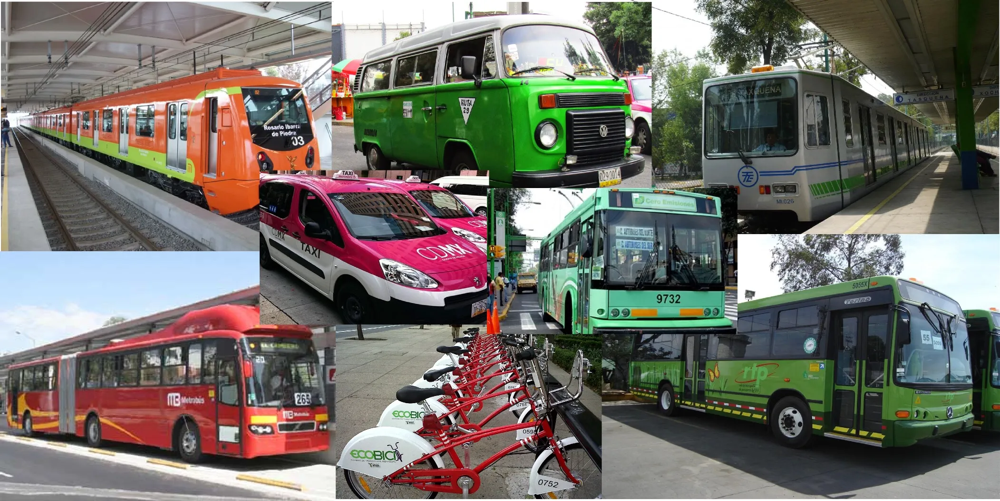

<a id="top"></a>
<div class="list-group" id="list-tab" role="tablist">
    <h3 style="text-align: left; background-color: #128EB3; font-family:Trebuchet MS; color: white; padding: 14px; line-height: 1; border-radius:10px"><b>Table of Contents📝</b></h3>
    
   * [1. Import Necessary Libraries and load data 🚗](#1)
   * [2. Exploratory Data Analysis 📊](#2)
   * [3. Data Transformation 🚲](#3)
   * [4. Conclusions 🚎](#4)


<h3 style="text-align: left; background-color: #128EB3; font-family:Trebuchet MS; color: white; padding: 14px; line-height: 1; border-radius:10px"> About Dataset📁</h3>

Mexico City has various means of transportation due to its population density, size and travel distances. They are all operated by different organisms and collect mobility data from users for maintenance, improvements and new routes.
This database contains preliminary data on the daily influx of passengers in public transport for informational purposes on the behavior of mobility during the health emergency by COVID-19 reported by the organizations mentioned below.
The dataset contains data in Spanish and perform the translation for the development of this project.
<h4> Means of transport definition:</h4>

- Sistema de Transporte Colectivo Metro (STC) / **Subway**
- Red de Transporte de Pasajeros (RTP) / **Passenger transport network** 
- Sistema de Transporte Eléctrico Tren Ligero (STP-Tren Ligero) / **Electric train**
- Sistema de Transporte Eléctrico Trolebus (STP-Trolebus) / **Electric train bus**
- Suburbano / **Suburban bus**
- Metrobus / **Subway bus**
- Ecobici / **Bike**

<h4> This dataset contains <mark>8 columns</mark>, each are:</h4>

- Organism
- Service_line **(subway or bus routes)**
- Week_day
- Date
- Card_payment **(people who paid with transport card)**
- Ticket_payment **(people who bought a ticket)**
- Total **(total number of people who traveled that day or influx of users)**
    

**SOURCE: https://datos.cdmx.gob.mx/dataset/afluencia-preliminar-en-transporte-publico**
    
    


    



<h3 style="text-align: left; background-color: #128EB3; font-family:Trebuchet MS; color: white; padding: 14px; line-height: 1; border-radius:10px"> Project goals🔎</h3>

- 📊 Explore and analyze the public transport in Mexico City over time for all its different means of transport

- 📝 Evaluate possible impacts that the closure of subway service line 1 may have

- ❓  Answer the following guiding questions:
    - Which is the column with the most non-null data?
    - Are all the data types for the columns correct?
    - What is the most used organism?
    - What is the most used service line?
    - What day of the week has the most use of public transport? How much?
    - What is the average number of users per means of transport?

<a id="1"></a>
<h3 style="text-align: left;
           background-color: #128EB3;
           font-family:Trebuchet MS; 
           color: white; 
           padding: 14px; 
           line-height: 1; 
           border-radius:10px"> 1. Import data & libraries
</h3>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go
from datetime import datetime
from plotly.subplots import make_subplots

mov_cdmx = pd.read_csv('cdmx_system_transport.csv') #mov = mobility
mov_cdmx

,id,organism,service_line,week_day,date,card_payment,ticket_payment,total
0,1,Ecobici,NaN,Sunday,01/03/2020,NaN,NaN,"11,238"
1,2,Ecobici,NaN,Monday,02/03/2020,NaN,NaN,"29,475"
2,3,Ecobici,NaN,Tuesday,03/03/2020,NaN,NaN,"31,855"
3,4,Ecobici,NaN,Wednesday,04/03/2020,NaN,NaN,"31,477"
4,5,Ecobici,NaN,Thursday,05/03/2020,NaN,NaN,"31,493"
...,...,...,...,...,...,...,...,...
18709,18710,Suburbano,L1,Monday,28/06/2021,NaN,NaN,NaN
18710,18711,Suburbano,L1,Tuesday,29/06/2021,NaN,NaN,NaN
18711,18712,Suburbano,L1,Wednesday,30/06/2021,NaN,NaN,NaN
18712,18713,Suburbano,L1,Thursday,01/07/2021,NaN,NaN,NaN


**We got 8 columns with 18714 rows:**

**5 numeric columns:** <u>id</u>, <u>card</u>,<u>ticket</u>, <u>total</u> <br><br>
**4 categorical columns:** <u>organism</u>, <u>service_line</u>, <u>day</u>, <u>date</u>


<a id="2"></a>
<h3 style="text-align: left; background-color: #128EB3; font-family:Trebuchet MS; color: white; padding: 14px; line-height: 1; border-radius:10px"> 2. Exploratory Data Analysis</h3>

In [2]:
#Data types for each column
mov_cdmx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18714 entries, 0 to 18713
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              18714 non-null  int64 
 1   organism        18714 non-null  object
 2   service_line    18225 non-null  object
 3   week_day        18714 non-null  object
 4   date            18714 non-null  object
 5   card_payment    2687 non-null   object
 6   ticket_payment  3598 non-null   object
 7   total           18512 non-null  object
dtypes: int64(1), object(7)
memory usage: 1.1+ MB


Not all data types are correct, for **date, card_payment, ticket_payment and total** columns the data type is incorrect.

Additionally the most non-null data columns are **id, organism, week_day and date**

In [3]:
#Dtype convert columns
mov_cdmx['total'] = mov_cdmx['total'].str.replace(',','')
mov_cdmx['card_payment'] = mov_cdmx['card_payment'].str.replace(',','')
mov_cdmx['ticket_payment'] = mov_cdmx['ticket_payment'].str.replace(',','')
#Convert with pandas to_numeric method
mov_cdmx['total'] = pd.to_numeric(mov_cdmx['total']).astype('Int64')
#Convert with python method
mov_cdmx['card_payment'] = mov_cdmx['card_payment'].astype(float).astype('Int64')
mov_cdmx['ticket_payment'] = mov_cdmx['ticket_payment'].astype(float).astype('Int64')
mov_cdmx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18714 entries, 0 to 18713
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              18714 non-null  int64 
 1   organism        18714 non-null  object
 2   service_line    18225 non-null  object
 3   week_day        18714 non-null  object
 4   date            18714 non-null  object
 5   card_payment    2687 non-null   Int64 
 6   ticket_payment  3598 non-null   Int64 
 7   total           18512 non-null  Int64 
dtypes: Int64(3), int64(1), object(4)
memory usage: 1.2+ MB


In [4]:
#Columns with null data
mov_cdmx.isnull().sum()

id                    0
organism              0
service_line        489
week_day              0
date                  0
card_payment      16027
ticket_payment    15116
total               202
dtype: int64

In [5]:
#Most used organism
mov_cdmx.groupby(['organism']).sum().sort_values(by = 'total', ascending=False)

,id,card_payment,ticket_payment,total
organism,,,,
STC,61939674,0,0,1022922255
Metrobús,7683420,0,0,301902718
RTP,21240406,2901873,88028954,90930827
STE-Trolebús,66686475,0,0,44246028
Suburbano,9031830,0,0,32609321
STE-Tren Ligero,6775095,0,0,12306738
Ecobici,119805,0,0,4672818
STE-Cablebús,1639550,0,0,385048


In [6]:
#Most used service line or route
mov_cdmx.groupby(['service_line','organism'])['total'].sum().sort_values(ascending=False)

service_line                                       organism       
L1                                                 STC                156984799
L2                                                 STC                139362943
L3                                                 STC                130511082
LB                                                 STC                101715310
L1                                                 Metrobús            92624682
L8                                                 STC                 90264901
LA                                                 STC                 83532311
L12                                                STC                 78835682
L9                                                 STC                 78760298
L7                                                 STC                 61453677
L5                                                 STC                 55510462
Ordinario                                          RT

In [7]:
#Day of the Week with the highest use of public transport
mov_cdmx.groupby(['week_day']).sum().sort_values(by = 'total', ascending = False)

,id,card_payment,ticket_payment,total
week_day,,,,
Wednesday,25086810,509129,14610021,240544976
Tuesday,25070806,503946,14768490,239477843
Thursday,25123146,512290,14613214,238240944
Friday,25145993,465812,14106565,237182340
Monday,25023905,456179,14183491,228317986
Saturday,24691353,278033,9237177,197344970
Sunday,24974242,176484,6509996,128866694


In [8]:
#Day of the week in which the highest number of public transport users have been presented
mov_cdmx.groupby(['week_day'])['total'].max().sort_values(ascending = False)

week_day
Friday       874324
Tuesday      820067
Wednesday    807048
Thursday     802291
Monday       770843
Saturday     747252
Sunday       454374
Name: total, dtype: Int64

In [9]:
#Columns with the highest percentage of null data
percentage_df = pd.DataFrame((mov_cdmx.isnull().sum()*100/len(mov_cdmx)).round(2))
percentage_df

,0
id,0.00
organism,0.00
service_line,2.61
week_day,0.00
date,0.00
card_payment,85.64
ticket_payment,80.77
total,1.08


In [10]:
#Dataframe format
percentage_df.reset_index(inplace=True)
percentage_df.rename(columns={'index':'columns', 
                              0:'percentage'}, inplace=True)
percentage_df

,columns,percentage
0,id,0.00
1,organism,0.00
2,service_line,2.61
3,week_day,0.00
4,date,0.00
5,card_payment,85.64
6,ticket_payment,80.77
7,total,1.08


In [11]:
#Visualization null data percentages by columns
fig = px.bar(percentage_df, x='columns', y='percentage',                 
                   template = 'plotly_dark',
                   text_auto=True,
                   color_discrete_sequence = px.colors.qualitative.Pastel
                  )

fig.update_layout(
    title={
        'text': 'Null data percentages by columns',
        'y':0.94,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_title='Percentage',
    xaxis_title='Columns',
    font=dict(
        family='Arial',
        size=14))

fig.show()

In [12]:
#Organisms that have a smaller amount of non-null data
mov_cdmx[mov_cdmx['ticket_payment'].notnull()]

,id,organism,service_line,week_day,date,card_payment,ticket_payment,total
3950,3951,RTP,Ordinario,Sunday,01/03/2020,51,85298,85349
3951,3952,RTP,Expreso,Sunday,01/03/2020,1537,42745,44282
3952,3953,RTP,Atenea,Sunday,01/03/2020,<NA>,1468,1468
3953,3954,RTP,Ecobús,Sunday,01/03/2020,555,16231,16786
3954,3955,RTP,Nocturno,Sunday,01/03/2020,59,7531,7590
...,...,...,...,...,...,...,...,...
7608,7609,RTP,Ecobús,Thursday,01/07/2021,2525,20658,23183
7609,7610,RTP,Nocturno,Thursday,01/07/2021,43,642,685
7610,7611,RTP,Eco Atenea,Thursday,01/07/2021,<NA>,1584,1584
7611,7612,RTP,Expreso Directo,Thursday,01/07/2021,218,1490,1708


In [13]:
mov_cdmx[mov_cdmx['card_payment'].notnull()]

,id,organism,service_line,week_day,date,card_payment,ticket_payment,total
3950,3951,RTP,Ordinario,Sunday,01/03/2020,51,85298,85349
3951,3952,RTP,Expreso,Sunday,01/03/2020,1537,42745,44282
3953,3954,RTP,Ecobús,Sunday,01/03/2020,555,16231,16786
3954,3955,RTP,Nocturno,Sunday,01/03/2020,59,7531,7590
3956,3957,RTP,Expreso Directo,Sunday,01/03/2020,1,0,1
...,...,...,...,...,...,...,...,...
7606,7607,RTP,Expreso,Thursday,01/07/2021,5442,51905,57347
7608,7609,RTP,Ecobús,Thursday,01/07/2021,2525,20658,23183
7609,7610,RTP,Nocturno,Thursday,01/07/2021,43,642,685
7611,7612,RTP,Expreso Directo,Thursday,01/07/2021,218,1490,1708


**We observe that there is only one organism with non-null data. Let's check it out.**

In [14]:
mov_cdmx.groupby(['organism'])['card_payment'].sum()

organism
Ecobici                  0
Metrobús                 0
RTP                2901873
STC                      0
STE-Cablebús             0
STE-Tren Ligero          0
STE-Trolebús             0
Suburbano                0
Name: card_payment, dtype: Int64

In [15]:
mov_cdmx.groupby(['organism'])['ticket_payment'].sum()

organism
Ecobici                   0
Metrobús                  0
RTP                88028954
STC                       0
STE-Cablebús              0
STE-Tren Ligero           0
STE-Trolebús              0
Suburbano                 0
Name: ticket_payment, dtype: Int64

- **Only Passenger Transport Network (RTP) makes a distinction of the user who paid by card or by ticket and which have the least amount of null data**

- **To remove the records or columns that have null data, it would be necessary to analyze the context of why only that organization makes the distinction or why no one else reports it**

- **At the moment, since no other organization has a record of "ticket_payment" and "card_payment", these columns could be omitted to obtain a cleaner dataframe, since we cannot carry out a deeper analysis with only RTP data.**



In [16]:
#Showing the distribution of null data by organism with a function
def nulls(organism):
    percentage = ((mov_cdmx[mov_cdmx['organism'] == organism]).isnull().sum()*100 / len(mov_cdmx[mov_cdmx['organism'] == organism])).round(2)
    return percentage

In [17]:
nulls('Ecobici')

id                  0.0
organism            0.0
service_line      100.0
week_day            0.0
date                0.0
card_payment      100.0
ticket_payment    100.0
total               0.2
dtype: float64

In [18]:
def nulls_by_organism(organism):
    percentage = ((mov_cdmx[mov_cdmx['organism'] == organism]).isnull().sum()*100 / len(mov_cdmx[mov_cdmx['organism'] == organism])).round(2)
    column = mov_cdmx.columns
    fig, ax = plt.subplots()
    bars = ax.bar(column, percentage, width=0.6)
# Plot format    
    ax.bar_label(bars, color='blue', fontsize=12) 
    plt.xlabel("Column", fontweight ='bold', fontsize = 14)
    plt.ylabel("Percentage", fontweight ='bold', fontsize = 14)
    plt.title("Null data percentage per organism", fontweight ='bold', fontsize = 15)
    plt.grid(visible = True, color ='grey',
        linestyle ='-', linewidth = 0.5,
        alpha = 0.5)
    plt.rcParams["figure.figsize"] = (16, 8)
    plt.rc('ytick', labelsize=14)
    plt.rc('xtick', labelsize=14)
    plt.xticks(rotation = -90)
    plt.show()

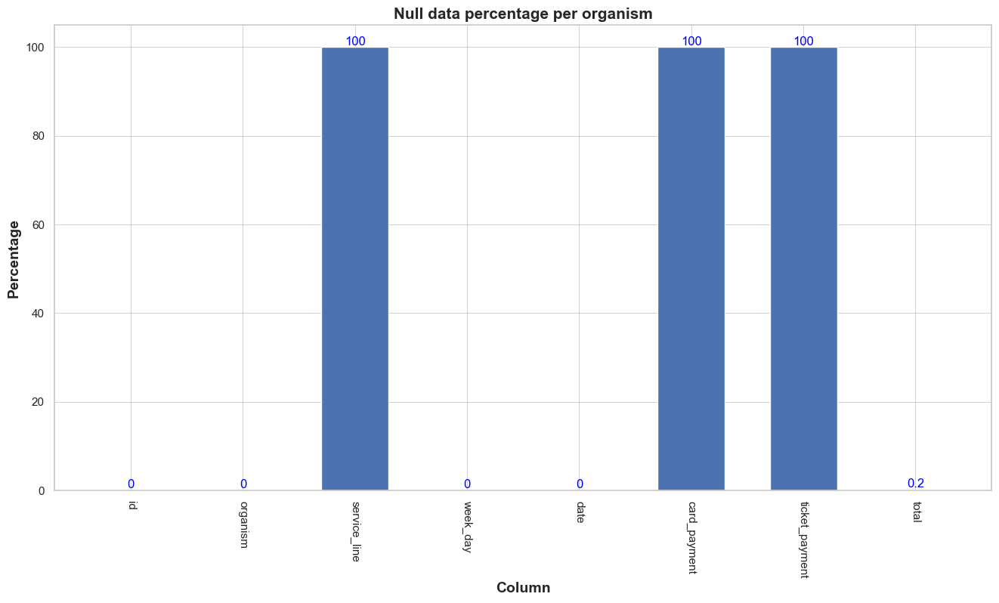

In [44]:
nulls_by_organism('Ecobici')

In [20]:
#Null values of a column sorted by organism with a function
def nulls_by_column(column):
# Organims and percentage list   
    list_per = []
    orglist = list(mov_cdmx['organism'].unique())
    for i in orglist:
        org = mov_cdmx[mov_cdmx['organism'] == i]
        per = (org[column].isnull().sum()*100 / mov_cdmx[column].isnull().sum()).round(2)
        list_per.append(per)
# Sort ant plot with seaborn dataframe
    dfnul = pd.DataFrame({'organism': orglist,
                   'percentage': list_per})
    ax = sns.barplot(x = orglist, y = list_per,
                order=dfnul.sort_values('percentage',ascending = False)['organism'])
# Formato de la gráfica    
    sns.set_theme(style="whitegrid")
    plt.xlabel('Organism', size=16)
    plt.ylabel('Percentage', size=16)
    plt.title('Null values distribution across different organisms', size=18)
    ax.bar_label(ax.containers[0], size=12)

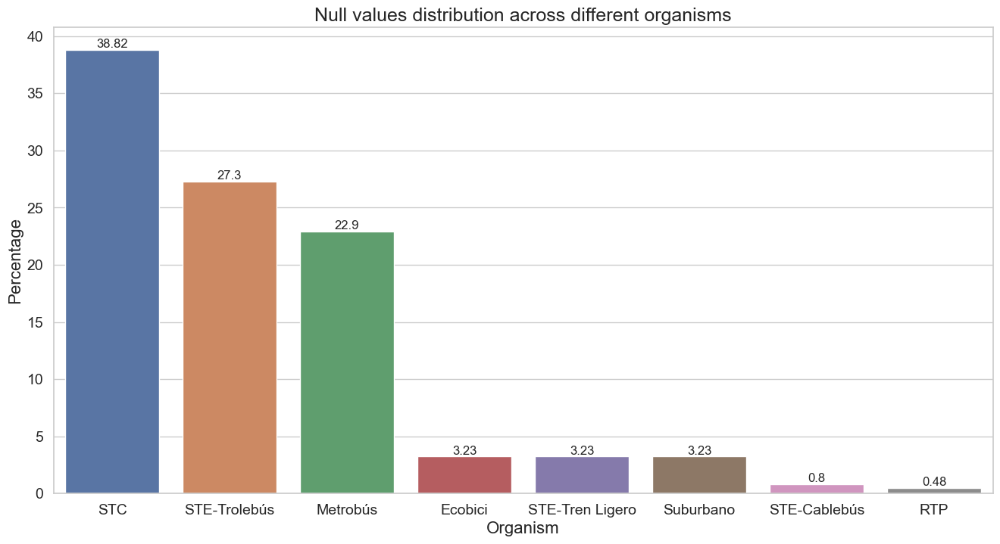

In [45]:
nulls_by_column('ticket_payment')

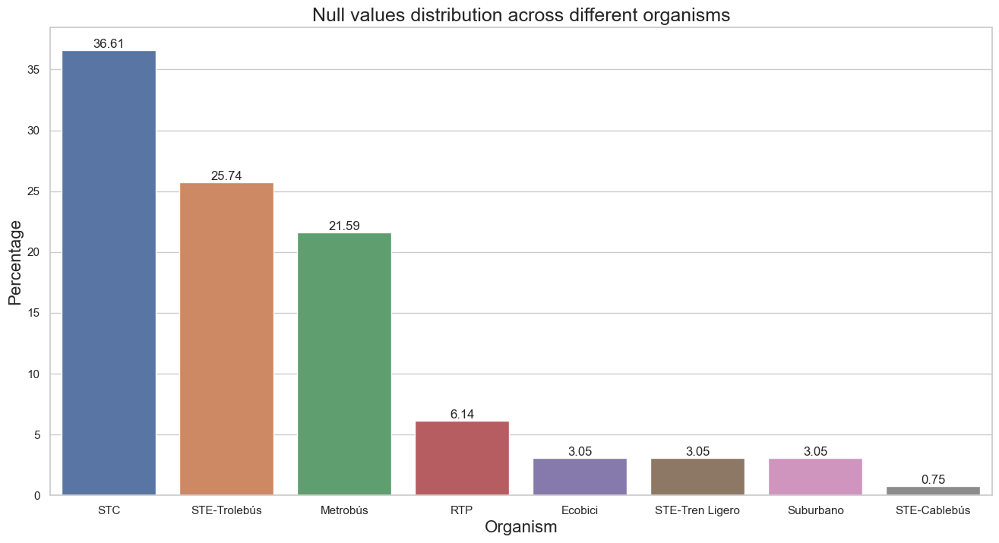

In [22]:
nulls_by_column('card_payment')

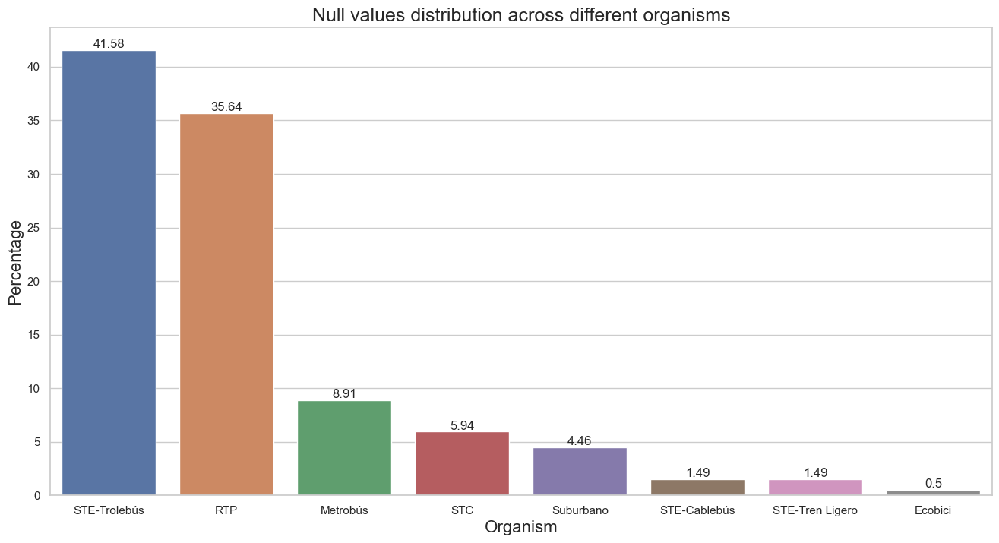

In [23]:
nulls_by_column('total')

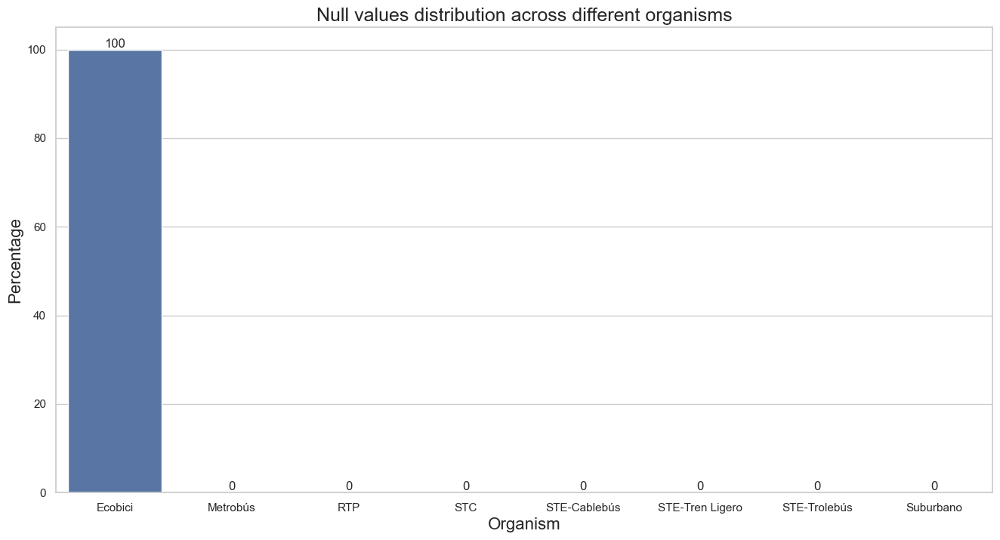

In [24]:
nulls_by_column('service_line')

**'Ecobici' or bicycle has 100% null values because it does not have routes or service lines**

In [25]:
#Verification
mov_cdmx.isnull().sum()

id                    0
organism              0
service_line        489
week_day              0
date                  0
card_payment      16027
ticket_payment    15116
total               202
dtype: int64

In [26]:
mov_cdmx[mov_cdmx['organism'] == 'Ecobici'].isnull().sum()

id                  0
organism            0
service_line      489
week_day            0
date                0
card_payment      489
ticket_payment    489
total               1
dtype: int64

In [27]:
#"ticket_payment", "card_payment", "total" distribution column histogram
fig = make_subplots(
    rows=3, cols=1,
    subplot_titles=("Ticket_payment", "Card_payment", "Total"))

fig.add_trace(go.Histogram(x=mov_cdmx['ticket_payment'], nbinsx = 40),
              row=1, col=1)

fig.add_trace(go.Histogram(x=mov_cdmx['card_payment'], nbinsx = 40),
              row=2, col=1)

fig.add_trace(go.Histogram(x=mov_cdmx['total'], nbinsx = 40),
              row=3, col=1)

fig.update_layout(height=1000, width=900,
                  title_text="Influx of users histogram")

fig.show()

**Total influx is concentrated in values from 0 to 50,000 users, on rare occasions mobility reaches 450,000-500,000 users.**

In [28]:
#"ticket_payment", "card_payment", "total" boxplot column
fig = px.box(mov_cdmx, y=["total", 'ticket_payment', 'card_payment'])
fig.update_layout(
    title={
        'text': 'Influx of users',
        'y':0.94,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_title='Value',
    xaxis_title='Influx',
    font=dict(
        family='Arial',
        size=14))

fig.show()

In [29]:
#Day with more users in public transport bar plot
fig = px.histogram( x = mov_cdmx['week_day'] ,y = mov_cdmx['total'], text_auto = True,
                  template = 'seaborn')

fig.update_layout(
    title={
        'text': 'Influx of users by day of the week',
        'y':0.94,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_title='Influx',
    xaxis_title='Week_day',
    font=dict(
        family='Arial',
        size=14))

fig.show()

In [30]:
#Day and public transport medium with more users using a heat map
fig = px.density_heatmap(
    mov_cdmx, x='week_day', y='organism', z='total', histfunc='sum')

fig.update_layout(
    title={
        'text': 'Public transport medium with more users',
        'y':0.94,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_title='Organism',
    xaxis_title='Day of the week',
    font=dict(
        family='Arial',
        size=14))

fig.show()

**We see that Wednesdays are the day with the highest influx of users in the Subway (STC) with a total of 161.67 million users**

In [31]:
#Organism and service line with the highest number of users in a heat map
fig = px.density_heatmap(
    mov_cdmx, x='organism', y='service_line', z='total', histfunc='sum')

fig.update_layout(width = 1000, height = 800,
    autosize = False,
    title={
        'text': 'Organism and service line with the highest number of users',
        'y':0.98,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_title='Service line',
    xaxis_title='Organism',
    font=dict(
        family='Arial',
        size=14))

fig.show()

<a id="3"></a>
<h3 style="text-align: left; background-color: #128EB3; font-family:Trebuchet MS; color: white; padding: 14px; line-height: 1; border-radius:6px"> 3. Data transformation</h3>

In [32]:
#Null data clean
mov_clean = mov_cdmx.dropna(how = 'any')
mov_clean.isnull().sum()

id                0
organism          0
service_line      0
week_day          0
date              0
card_payment      0
ticket_payment    0
total             0
dtype: int64

In [33]:
len(mov_clean)

2686

In [34]:
#Data clean percentage comparative 
(len(mov_clean) / len(mov_cdmx))*100

14.352890883830288

**We have 14.35% clean data compared to the original dataframe**

In [35]:
#Removing duplicate values
mov_cdmx.duplicated().sum()

0

In [36]:
#Changing the data type of the column "date" 
mov_cdmx['date'] = pd.to_datetime(mov_cdmx['date'], format="%d/%m/%Y")

In [37]:
#Creating a dataframe with day and week of the day number
date_serie = mov_cdmx['date']
date_serie

0       2020-03-01
1       2020-03-02
2       2020-03-03
3       2020-03-04
4       2020-03-05
           ...    
18709   2021-06-28
18710   2021-06-29
18711   2021-06-30
18712   2021-07-01
18713   2021-07-02
Name: date, Length: 18714, dtype: datetime64[ns]

In [38]:
day_serie = mov_cdmx['week_day']
day_serie

0           Sunday
1           Monday
2          Tuesday
3        Wednesday
4         Thursday
           ...    
18709       Monday
18710      Tuesday
18711    Wednesday
18712     Thursday
18713       Friday
Name: week_day, Length: 18714, dtype: object

In [39]:
#Returns the day of the datetime
date1 =  date_serie.dt.day
date1

0         1
1         2
2         3
3         4
4         5
         ..
18709    28
18710    29
18711    30
18712     1
18713     2
Name: date, Length: 18714, dtype: int64

In [40]:
#Return the day of the week. It is assumed the week starts on Monday, 
#which is denoted by 0 and ends on Sunday which is denoted by 6.
date2 = date_serie.dt.weekday
date2

0        6
1        0
2        1
3        2
4        3
        ..
18709    0
18710    1
18711    2
18712    3
18713    4
Name: date, Length: 18714, dtype: int64

In [41]:
df_date = pd.concat([date_serie, day_serie, date1, date2], axis = 1)
df_date.columns = ['date','week_day_str', 'day_date', 'week_day_int']
df_date.head(15)

,date,week_day_str,day_date,week_day_int
0,2020-03-01,Sunday,1,6
1,2020-03-02,Monday,2,0
2,2020-03-03,Tuesday,3,1
3,2020-03-04,Wednesday,4,2
4,2020-03-05,Thursday,5,3
5,2020-03-06,Friday,6,4
6,2020-03-07,Saturday,7,5
7,2020-03-08,Sunday,8,6
8,2020-03-09,Monday,9,0
9,2020-03-10,Tuesday,10,1


In [42]:
#Mobility timeline dataframe
mov_date = pd.DataFrame(mov_cdmx.groupby(['date'])['total'].sum())
mov_date.reset_index(inplace = True)
mov_date

,date,total
0,2020-03-01,3527802
1,2020-03-02,7120556
2,2020-03-03,7314161
3,2020-03-04,7361937
4,2020-03-05,7386438
...,...,...
484,2021-06-28,3670498
485,2021-06-29,3800277
486,2021-06-30,3595574
487,2021-07-01,2805590


In [43]:
#Mobility timeline plot
fig = px.line(mov_date, x='date', y="total",
             template = 'seaborn')

fig.update_layout(
    title={
        'text': 'Use of public transport from March 2020 to July 2021',
        'y':0.94,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_title='Influx of users',
    xaxis_title='Date',
    font=dict(
        family='Arial',
        size=14))

fig.show()

**We observed a large decrease in the use of public transport at the beginning of the COVID-19 contingency**

<a id="4"></a>
<h3 style="text-align: left; background-color: #128EB3; font-family:Trebuchet MS; color: white; padding: 14px; line-height: 1; border-radius:6px"> 4. Conclusions 💡</h3>

- The most used transport system is the Subway, for which it is necessary to carry out preventive and corrective maintenance, as well as the opening of new service lines and the modernization of existing ones with Line 1 being the oldest and used by users, so its temporary closure will cause inconvenience, longer transfer times, delays and congestion of other means of transport.
- Investigate why the only organization that records users who pay by ticket or card is the Passenger Transport Network (RTP), which leads to a large amount of null data from other organizations.
- Despite the fact that in the 'service_line' column there are 100% null values, these are entirely due to 'Ecobici' (bicycle) since it does not have lines.
- No duplicate values or typing errors were found that could affect the analysis.
- Few abnormalities are observed in the data capture by the different organisms (with the exception of the 'ticket_payment' and 'card_payment' columns).
- The influx of users is very high during the week, being reduced on rest days, especially on Sundays, a slight decrease can also be observed during the Christmas season.
- Mobility in Mexico City was reduced by almost 50% compared to what it was before the health contingency, maintaining a constant mobility that ranged between 3 - 3.8 million users per day. Initially, it can be seen that it did not exceed 2 million users per day, however, it has been gradually increasing.



<h1 style= 'text-align: center; color: blue'> Thanks for reading 😊 Your comments are welcome!🧐 </h1>
<br>